<div align=center>

<p></p>
<p></p>
<font size=5>
In the Name of God
<font/>
<p></p>
 <br/>
    <br/>
<font color=#4d7db8>
Sharif University of Technology - Department of Electrical Engineering
</font>
<p></p>
<font color=#4d7db8>
Introduction To Machine Learning - Dr. Sajjad Amini
</font>
<br/>
<br/>
Spring Semester 1401-02

<div/>

<hr/>
		<div align=center>
		    <font color=red size=6>
			    <br />
Project - 3rd Phase
<br />
Image Super Resolution using Autoencoder
			</font>
    <br/>
<font size=4>
			<br/><br/>
Due on Tir 10th
                <br/><b>
              Cheating is Strongly Prohibited
                </b><br/><br/>
                <font color=green>
Should you have any questions concerning the project, please feel free to ask via Telegram.
     </font>
</font>
                <br/>
    </div>

# Personal Info
<hr/>
    <div class="column" align=center>
    <font size=4>
        <div class="column">
        <br />
            student_number = 99106255
            <br />
            Name = Alireza
            <br />
            Last_Name = Shokrani
        </div>
        <div class="column">
        <br />
            student_number = 99105901
            <br />
            Name = Amirhossein  
            <br />
            Last_Name = Akbari
        </div>
    </font>
    </div>


1. Download the "image super resolution (from unsplash)" dataset and split it's validation set to new validation set and test set.
2. Design and train an AutoEncoder using `PyTorch` (not `TensorFlow`) on the dataset to enhance the resolution of images from low resolution to high resolution.
3. plot learning curve and visualize low resolution images of test set, their corresponding high resolution images and their reconstructed versions side by side.

# Import Necessary Libraries

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import os
import shutil
from sklearn.model_selection import train_test_split
import csv
from PIL import Image
from torch.utils.data import Dataset

# Load Dataset and Prepare It

In [2]:
base_dir = './content/Image Super Resolution - Unsplash'
csv_file_path = os.path.join(base_dir, 'image_data.csv')

low2high_dict = {}

with open(csv_file_path, 'r') as csv_file:
    csv_reader = csv.reader(csv_file)
    next(csv_reader)
    for row in csv_reader:
        if len(row) >= 2:  # Make sure the row has at least 2 columns
            key = row[0]
            value = row[1]
            low2high_dict[key] = value

In [3]:
class SuperResDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.low_dir = os.path.join(root_dir)
        self.image_filenames = [i for i in os.listdir(self.low_dir) if int(i.split('.')[0][-1]) == 4]
        self.transform = transform

    def __getitem__(self, index):
        low_path = os.path.join(self.low_dir, self.image_filenames[index])
        high_path = os.path.join(base_dir, "high res",  low2high_dict[self.image_filenames[index]])

        low_image = Image.open(low_path).convert("RGB")
        high_image = Image.open(high_path).convert("RGB")

        if self.transform:
            low_image = self.transform(low_image)
            high_image = self.transform(high_image)

        return low_image, high_image

    def __len__(self):
        return len(self.image_filenames)



# Define transformations
transform = transforms.Compose([
    transforms.Resize((800, 1200)),  # Resize the images to a common size
    transforms.ToTensor()  # Convert images to tensors
])

# Load the dataset
train_set = SuperResDataset("./content/Image Super Resolution - Unsplash/train", transform=transform)
validation_set = SuperResDataset("./content/Image Super Resolution - Unsplash/val", transform=transform)
test_set = SuperResDataset("./content/Image Super Resolution - Unsplash/test", transform=transform)

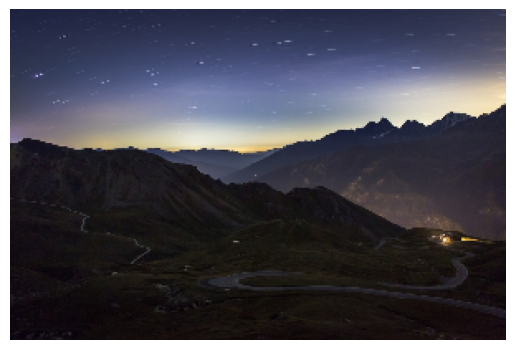

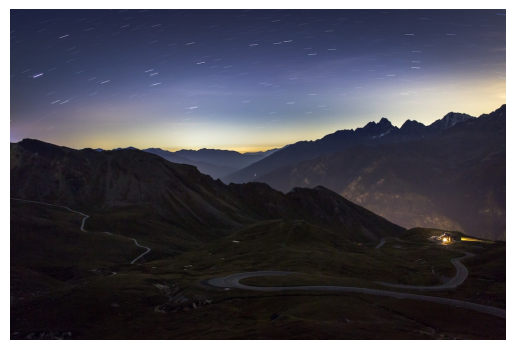

In [4]:
plt.imshow(train_set[35][0].permute(1, 2, 0))
plt.axis("off")
plt.show()
plt.imshow(train_set[35][1].permute(1, 2, 0))
plt.axis("off")
plt.show()

# Define Your Model
torch neural network model

In [5]:
class AutoEncoder(nn.Module):
    def __init__(self, upscale_factor=1, num_channels=3, d=32, s=8, m=4):
        super(AutoEncoder, self).__init__()

        self.feature_extraction = nn.Sequential(
            nn.Conv2d(num_channels, d, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

        self.shrinking = nn.Sequential(
            nn.Conv2d(d, s, kernel_size=1),
            nn.ReLU(inplace=True)
        )

        self.mapping = nn.Sequential(
            nn.Conv2d(s, s, kernel_size=3, padding=1, groups=s),
            nn.ReLU(inplace=True),
            nn.Conv2d(s, s, kernel_size=1),
            nn.ReLU(inplace=True)
        )

        self.expanding = nn.Sequential(
            nn.Conv2d(s, d, kernel_size=1),
            nn.ReLU(inplace=True)
        )

        self.deconvolution = nn.ConvTranspose2d(d, num_channels, kernel_size=9, stride=upscale_factor, padding=4, output_padding=upscale_factor-1)
    def forward(self, x):
        features = self.feature_extraction(x)
        shrinking = self.shrinking(features)
        mapping = self.mapping(shrinking)
        expanding = self.expanding(mapping)
        out = self.deconvolution(expanding)
        return out

# Fit The Model
Also Define optimizer, Criterion and other parameters

In [6]:
print(torch.cuda.is_available())
torch.cuda.empty_cache()
samples = None
targets = None
torch.cuda.empty_cache()

True


In [7]:
# Define hyperparameters
learning_rate = 0.001
batch_size = 2
num_epochs = 20
accumulation_steps = 2  # Accumulate gradients over 2 batches before performing an update

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model and move it to the GPU
model = AutoEncoder().to(device)

# Define optimizer and criterion
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()

train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_set, batch_size=batch_size)

# Train the model
for epoch in range(num_epochs):
    model.train()
    accumulated_loss = 0.0
    for batch_idx, (samples, targets) in enumerate(train_loader):
        # Move images to GPU
        samples = samples.to(device)
        targets = targets.to(device)
        # Forward pass
        outputs = model(samples)
        # Compute loss
        loss = criterion(outputs, targets)
        accumulated_loss += loss.item()
        # Backward pass
        loss.backward()

        # Perform optimization after accumulating gradients for accumulation_steps batches
        if (batch_idx + 1) % accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()
        
        # Clear intermediate variables and free GPU memory
        samples = None
        targets = None
        torch.cuda.empty_cache()

    # Validate the model
    model.eval()
    with torch.no_grad():
        total_loss = 0.0
        for samples, targets in validation_loader:
            # Move images to GPU
            samples = samples.to(device)
            targets = targets.to(device)
            outputs = model(samples)
            loss = criterion(outputs, targets)
            total_loss += loss.item()

    # Print progress
    print(f"Epoch [{epoch+1}/{num_epochs}], Validation Loss: {total_loss/len(validation_loader)}")

    # Clear intermediate variables and free GPU memory
    samples = None
    targets = None
    torch.cuda.empty_cache()


Epoch [1/20], Validation Loss: 0.005723725447593176
Epoch [2/20], Validation Loss: 0.005327813277962496
Epoch [3/20], Validation Loss: 0.0032484806769112447
Epoch [4/20], Validation Loss: 0.002764461599049948
Epoch [5/20], Validation Loss: 0.0026554228448810095
Epoch [6/20], Validation Loss: 0.002501525540023779
Epoch [7/20], Validation Loss: 0.0024515048136653722
Epoch [8/20], Validation Loss: 0.002473491013401856
Epoch [9/20], Validation Loss: 0.0023498463429543494
Epoch [10/20], Validation Loss: 0.002311109202824098
Epoch [11/20], Validation Loss: 0.0025527175584220854
Epoch [12/20], Validation Loss: 0.0027453726576388126
Epoch [13/20], Validation Loss: 0.002366304528233899
Epoch [14/20], Validation Loss: 0.0024825337437189023
Epoch [15/20], Validation Loss: 0.002371888925035423
Epoch [16/20], Validation Loss: 0.002283000111872199
Epoch [17/20], Validation Loss: 0.0022512879606991824
Epoch [18/20], Validation Loss: 0.004018788094348882
Epoch [19/20], Validation Loss: 0.0022787302337

In [65]:
# for g in optimizer.param_groups:
#     g['lr'] = 0.002


# Plot The Results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


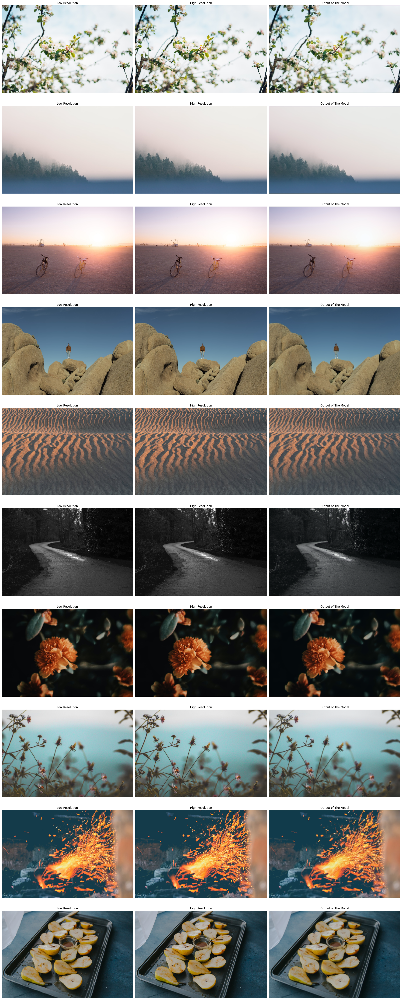

In [9]:
model.eval()
test_loader = torch.utils.data.DataLoader(test_set, batch_size=10, shuffle=True)
itr = iter(test_loader)
samples, targets = next(itr)

with torch.no_grad():
    outputs = model(samples.to(device))
    outputs = outputs.to("cpu")


fig, axes = plt.subplots(10, 3, figsize=(24, 60))

for i in range(10):

    axes[i, 0].imshow(samples[i].permute(1, 2, 0), cmap='gray')
    axes[i, 0].axis("off")
    axes[i, 0].set_title("Low Resolution")

    axes[i, 1].imshow(targets[i].permute(1, 2, 0), cmap='gray')
    axes[i, 1].axis("off")
    axes[i, 1].set_title("High Resolution")

    axes[i, 2].imshow(outputs[i].permute(1, 2, 0), cmap='gray')
    axes[i, 2].axis("off")
    axes[i, 2].set_title("Output of The Model")

plt.tight_layout()
plt.show()